# Fix pathing

In [1]:
import sys


sys.path.append("..")


In [2]:
import constants

import os


constants.PROJECT_DIRECTORY_PATH = os.path.dirname(os.path.dirname(constants.PROJECT_DIRECTORY_PATH))


# Init

In [3]:
import datahandler

data_preprocessor = datahandler.DataPreprocessorOUS_V2()
data_preprocessor.execute()

data_loader = datahandler.DataLoader(datahandler.DataPreprocessorOUS_V2)
data_loader.execute()


Loading dataset: 100%|██████████| 6/6 [00:17<00:00,  2.88s/it]


# Imports

In [4]:
import utils

import folium
import matplotlib
import matplotlib.pyplot as plt
import numpy as np


# Plot processed data

In [5]:
df = utils.copy_dataframe(data_loader.processed_incidents_df)

df.drop_duplicates(subset="grid_id", inplace=True)

# Create a base map centered around the average latitude and longitude
m = folium.Map(location=[df["longitude"].mean(), df["latitude"].mean()], zoom_start=10)

# Add rectangles for each row in the dataframe
for _, row in df.iterrows():
    folium.Polygon(locations=utils.get_cell_corners(row['x'], row['y']), color='blue', fill=True, fill_opacity=0.3).add_to(m)

m


In [6]:
# Create a colormap
colormap = matplotlib.colormaps["viridis"]

# Create a base map centered around the average latitude and longitude
m = folium.Map(location=[df["latitude"].mean(), df["longitude"].mean()], zoom_start=10)

# Add rectangles for each row in the dataframe
for _, row in df.iterrows():
    urban = row["urban_settlement_ssb"]

    rgba_color = [255, 0, 0]
    if (urban):
        rgba_color = [0, 0, 255]

    hex_color = "#{:02x}{:02x}{:02x}".format(*rgba_color)

    folium.Polygon(
        locations=utils.get_cell_corners(row["x"], row["y"]),
        color=None,
        fill=True,
        fill_color=hex_color,
        fill_opacity=0.7,
        tooltip=f"{freq}"
    ).add_to(m)

m


NameError: name 'freq' is not defined

In [ ]:
# Count the frequency of each grid_id
grid_id_count = data_loader.enhanced_incidents_df["grid_id"].value_counts()
grid_id_count_log = np.log1p(grid_id_count)

# Normalize the frequencies
max_count = grid_id_count_log.max()
min_count = grid_id_count_log.min()
norm = plt.Normalize(min_count, max_count)

# Create a colormap
colormap = matplotlib.colormaps["viridis"]

# Create a base map centered around the average latitude and longitude
m = folium.Map(location=[df["longitude"].mean(), df["latitude"].mean()], zoom_start=10)

# Add rectangles for each row in the dataframe
for _, row in df.iterrows():
    freq = grid_id_count.get(row["grid_id"], 0)
    freq_log = np.log1p(freq)
    rgba_color = [int(x * 255) for x in colormap(norm(freq_log))[:3]]
    hex_color = "#{:02x}{:02x}{:02x}".format(*rgba_color)

    folium.Polygon(
        locations=utils.get_cell_corners(row["x"], row["y"]),
        color=None,
        fill=True,
        fill_color=hex_color,
        fill_opacity=0.7,
        tooltip=f"{freq}"
    ).add_to(m)

m


# Plot enhanced data

In [ ]:
df = utils.copy_dataframe(data_loader.enhanced_incidents_df)

df.drop_duplicates(subset="grid_id", inplace=True)

# Create a base map centered around the average latitude and longitude
m = folium.Map(location=[df["longitude"].mean(), df["latitude"].mean()], zoom_start=10)

# Add rectangles for each row in the dataframe
for _, row in df.iterrows():
    folium.Polygon(locations=utils.get_cell_corners(row['x'], row['y']), color='blue', fill=True, fill_opacity=0.3, tooltip=f"{row['grid_id']}").add_to(m)

m


In [ ]:
# Count the frequency of each grid_id
grid_id_count = data_loader.enhanced_incidents_df["grid_id"].value_counts()
grid_id_count_log = np.log1p(grid_id_count)

# Normalize the frequencies
max_count = grid_id_count_log.max()
min_count = grid_id_count_log.min()
norm = plt.Normalize(min_count, max_count)

# Create a colormap
colormap = matplotlib.colormaps["viridis"]

# Create a base map centered around the average latitude and longitude
m = folium.Map(location=[df["longitude"].mean(), df["latitude"].mean()], zoom_start=10)

# Add rectangles for each row in the dataframe
for _, row in df.iterrows():
    freq = grid_id_count.get(row["grid_id"], 0)
    freq_log = np.log1p(freq)
    rgba_color = [int(x * 255) for x in colormap(norm(freq_log))[:3]]
    hex_color = "#{:02x}{:02x}{:02x}".format(*rgba_color)

    folium.Polygon(
        locations=utils.get_cell_corners(row["x"], row["y"]),
        color=None,
        fill=True,
        fill_color=hex_color,
        fill_opacity=0.7,
        tooltip=f"{freq}"
    ).add_to(m)

m


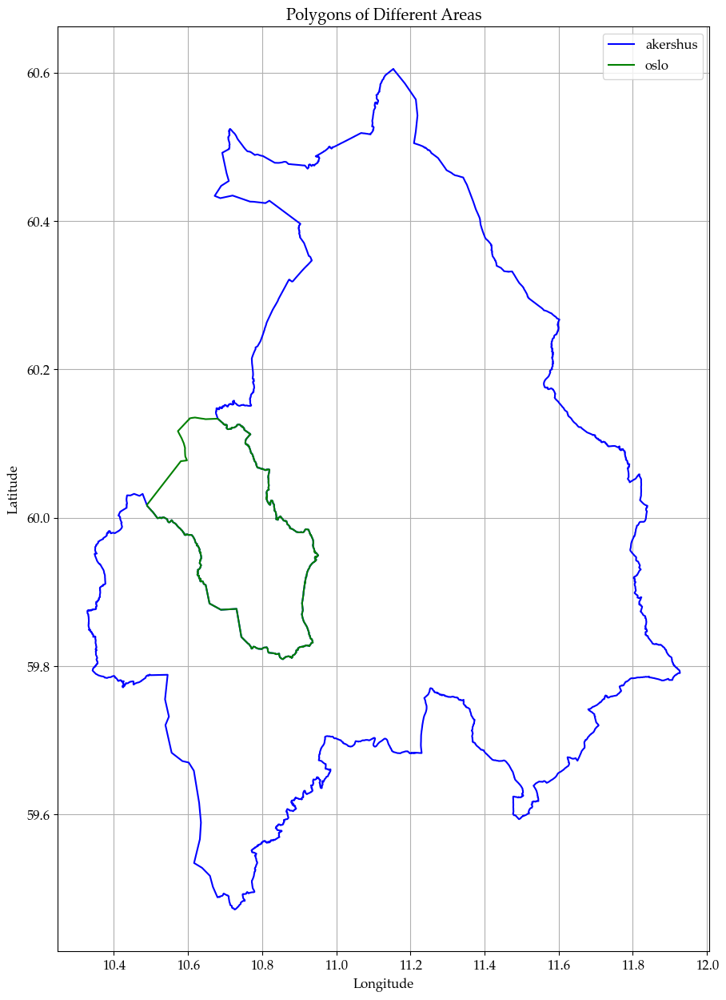

In [ ]:
# Call the corrected function to plot the GeoJSON polygons in a single plot
utils.plot_multiple_geojson_polygons_in_one_plot_corrected(
    file_paths=[
        os.path.join(constants.PROJECT_DIRECTORY_PATH, "data", "ssb_2019_akershus_polygon_epsg4326.geojson"),
        os.path.join(constants.PROJECT_DIRECTORY_PATH, "data", "ssb_2019_oslo_polygon_epsg4326.geojson")
    ],
    labels=["akershus", "oslo"],
    colors=["blue", "green"]
)

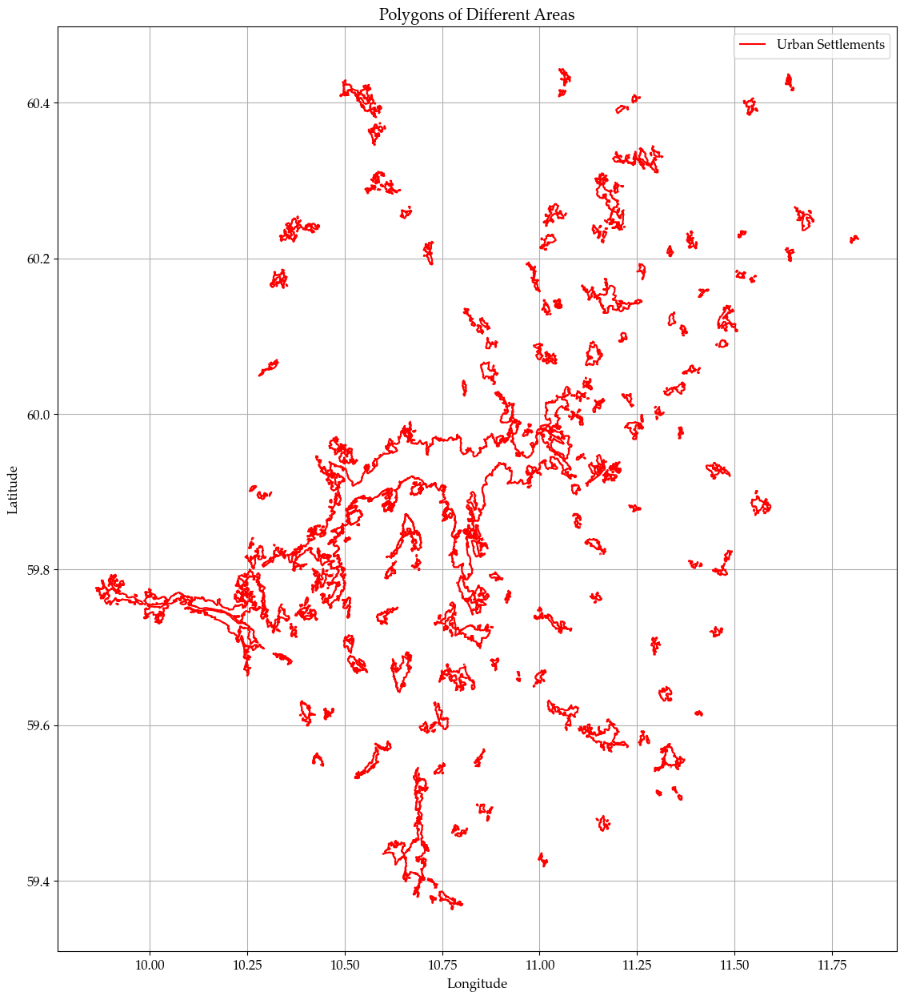

In [ ]:
# Call the corrected function to plot the GeoJSON polygons in a single plot
utils.plot_multiple_geojson_polygons_in_one_plot_corrected(
    file_paths=[
        os.path.join(constants.PROJECT_DIRECTORY_PATH, "data", "ssb_2021_urban_settlements_polygon_epsg4326.geojson")
    ],
    labels=["Urban Settlements"],
    colors=["red"]
)

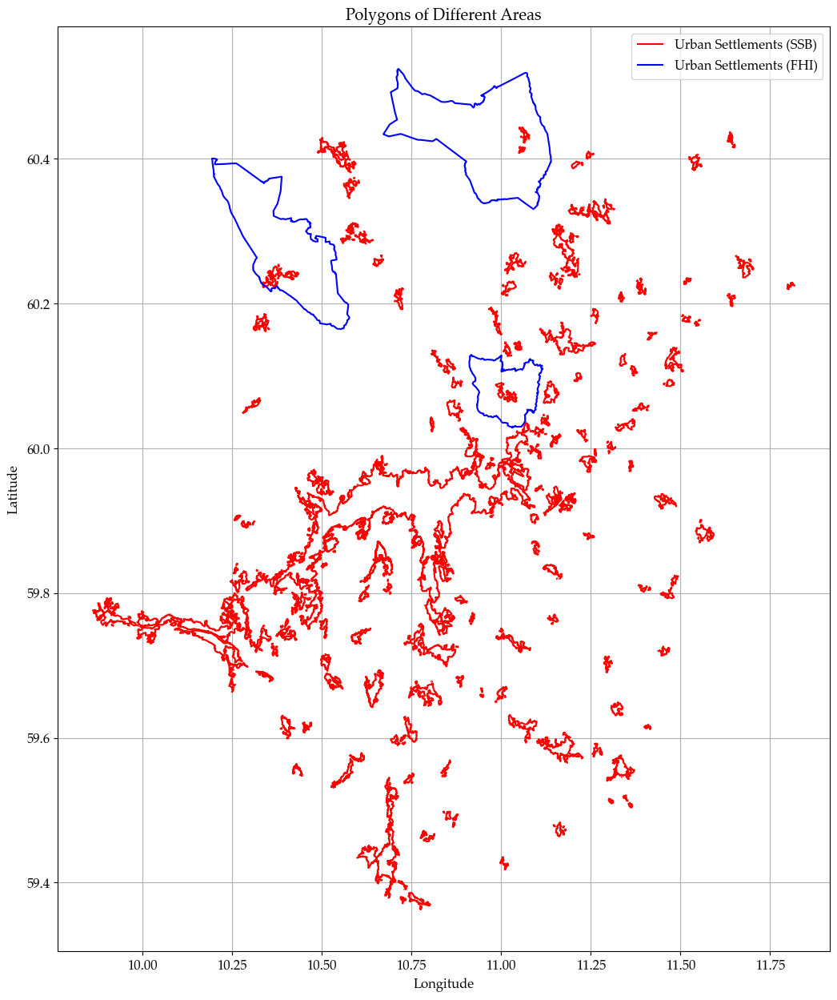

In [ ]:
# Call the corrected function to plot the GeoJSON polygons in a single plot
utils.plot_multiple_geojson_polygons_in_one_plot_corrected(
    file_paths=[
        os.path.join(constants.PROJECT_DIRECTORY_PATH, "data", "ssb_2021_urban_settlements_polygon_epsg4326.geojson"),
        os.path.join(constants.PROJECT_DIRECTORY_PATH, "data", "nonurban_municipalities.geojson")
    ],
    labels=["Urban Settlements (SSB)", "Urban Settlements (FHI)"],
    colors=["red", "blue"]
)


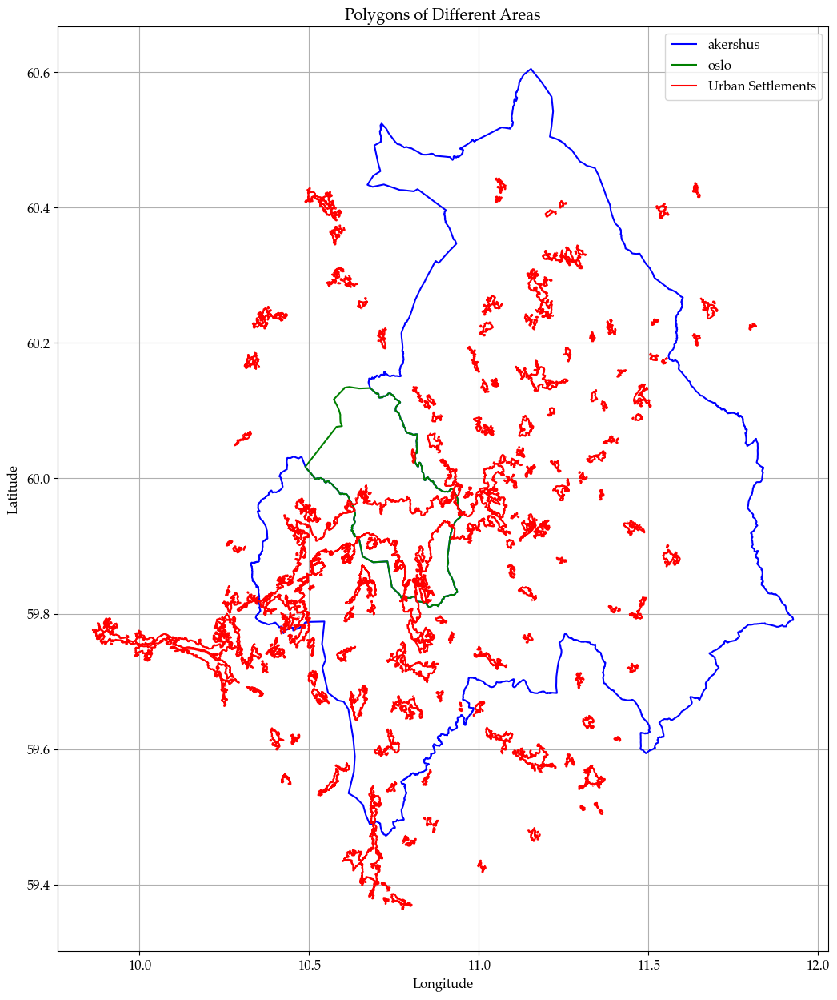

In [7]:
# Call the corrected function to plot the GeoJSON polygons in a single plot
utils.plot_multiple_geojson_polygons_in_one_plot_corrected(
    file_paths=[
        os.path.join(constants.PROJECT_DIRECTORY_PATH, "data", "ssb_2019_akershus_polygon_epsg4326.geojson"),
        os.path.join(constants.PROJECT_DIRECTORY_PATH, "data", "ssb_2019_oslo_polygon_epsg4326.geojson"),
        os.path.join(constants.PROJECT_DIRECTORY_PATH, "data", "ssb_2021_urban_settlements_polygon_epsg4326.geojson")
    ],
    labels=["akershus", "oslo", "Urban Settlements"],
    colors=["blue", "green", "red"]
)

In [11]:
import os
import json
from shapely.geometry import shape, mapping, MultiPolygon, Polygon

# Load GeoJSON files
akershus_path = os.path.join(constants.PROJECT_DIRECTORY_PATH, "data", "ssb_2019_akershus_polygon_epsg4326.geojson")
oslo_path = os.path.join(constants.PROJECT_DIRECTORY_PATH, "data", "ssb_2019_oslo_polygon_epsg4326.geojson")

with open(akershus_path) as f:
    akershus_geojson = json.load(f)

with open(oslo_path) as f:
    oslo_geojson = json.load(f)

# Extract polygons from GeoJSON
akershus_polygon = shape(akershus_geojson['features'][0]['geometry'])
oslo_polygon = shape(oslo_geojson['features'][0]['geometry'])

# Combine geometries
combined_geometry = akershus_polygon.union(oslo_polygon)

# Convert combined geometry to GeoJSON format
combined_feature = {
    "type": "Feature",
    "properties": {},
    "geometry": mapping(combined_geometry)
}

# Save combined GeoJSON file
combined_geojson = {
    "type": "FeatureCollection",
    "features": [combined_feature]
}

combined_geojson_path = os.path.join(constants.PROJECT_DIRECTORY_PATH, "data", "combined_akershus_oslo.geojson")
with open(combined_geojson_path, 'w') as f:
    json.dump(combined_geojson, f)

print("Combined GeoJSON file saved successfully.")


Combined GeoJSON file saved successfully.


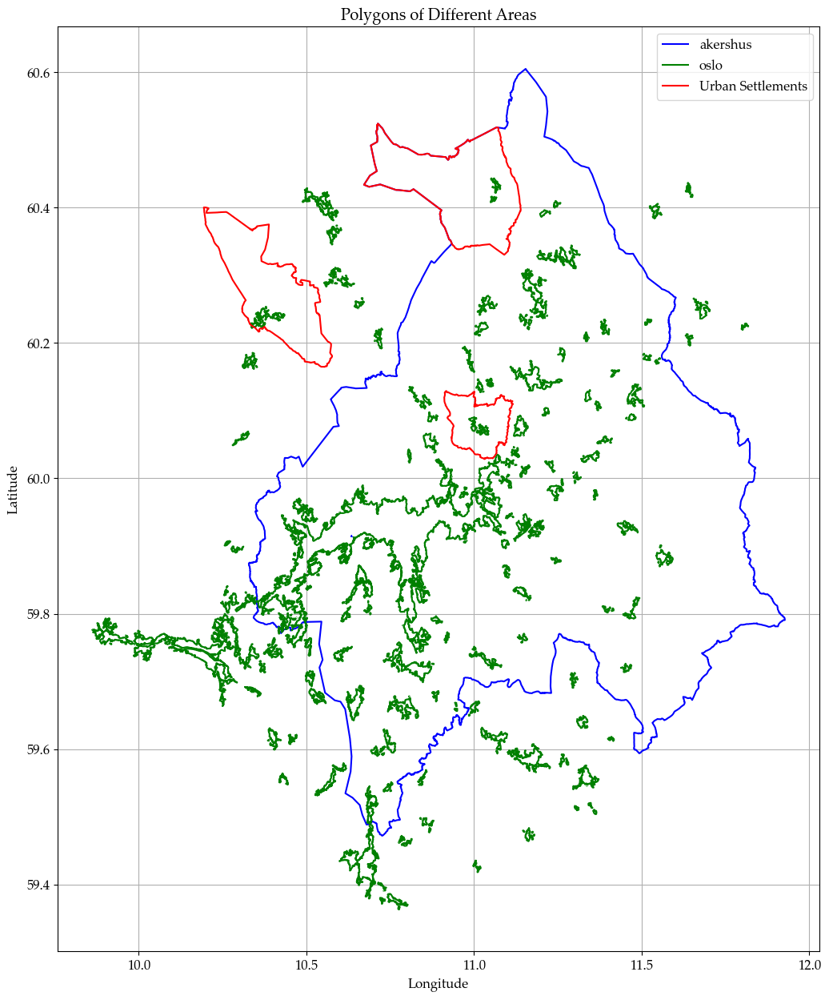

In [14]:
# Call the corrected function to plot the GeoJSON polygons in a single plot
utils.plot_multiple_geojson_polygons_in_one_plot_corrected(
    file_paths=[
        os.path.join(constants.PROJECT_DIRECTORY_PATH, "data", "combined_akershus_oslo.geojson"),
        os.path.join(constants.PROJECT_DIRECTORY_PATH, "data", "ssb_2021_urban_settlements_polygon_epsg4326.geojson"),
        os.path.join(constants.PROJECT_DIRECTORY_PATH, "data", "nonurban_municipalities.geojson")
    ],
    labels=["Oslo and Akershus", "oslo", "Urban Settlements"],
    colors=["blue", "green", "red"]
)

In [18]:
import os
import json
from shapely.geometry import shape, mapping, Polygon

# Load GeoJSON files
combined_geojson_path = os.path.join(constants.PROJECT_DIRECTORY_PATH, "data", "combined_akershus_oslo.geojson")
urban_settlements_path = os.path.join(constants.PROJECT_DIRECTORY_PATH, "data", "ssb_2021_urban_settlements_polygon_epsg4326.geojson")
nonurban_municipalities_path = os.path.join(constants.PROJECT_DIRECTORY_PATH, "data", "nonurban_municipalities.geojson")

with open(combined_geojson_path) as f:
    combined_geojson = json.load(f)

with open(urban_settlements_path) as f:
    urban_settlements_geojson = json.load(f)

with open(nonurban_municipalities_path) as f:
    nonurban_municipalities_geojson = json.load(f)

# Extract combined Akershus and Oslo polygon
combined_polygon = shape(combined_geojson['features'][0]['geometry'])

# Clip urban settlements polygons to the extent of combined Akershus and Oslo
clipped_urban_settlements = []
for feature in urban_settlements_geojson['features']:
    urban_settlement_polygon = shape(feature['geometry'])
    clipped_polygon = urban_settlement_polygon.intersection(combined_polygon)
    if not clipped_polygon.is_empty:
        clipped_urban_settlements.append(clipped_polygon)

# Clip non-urban municipalities polygons to the extent of combined Akershus and Oslo
clipped_nonurban_municipalities = []
for feature in nonurban_municipalities_geojson['features']:
    nonurban_municipality_polygon = shape(feature['geometry'])
    clipped_polygon = nonurban_municipality_polygon.intersection(combined_polygon)
    if not clipped_polygon.is_empty:
        clipped_nonurban_municipalities.append(clipped_polygon)

# Convert resulting geometries to GeoJSON format
clipped_urban_settlements_features = [{
    "type": "Feature",
    "properties": {},
    "geometry": mapping(polygon)
} for polygon in clipped_urban_settlements]

clipped_nonurban_municipalities_features = [{
    "type": "Feature",
    "properties": {},
    "geometry": mapping(polygon)
} for polygon in clipped_nonurban_municipalities]

# Save resulting GeoJSON files
clipped_urban_settlements_geojson = {
    "type": "FeatureCollection",
    "features": clipped_urban_settlements_features
}
clipped_nonurban_municipalities_geojson = {
    "type": "FeatureCollection",
    "features": clipped_nonurban_municipalities_features
}

clipped_urban_settlements_path = os.path.join(constants.PROJECT_DIRECTORY_PATH, "data", "clipped_ssb_urban_settlements.geojson")
clipped_nonurban_municipalities_path = os.path.join(constants.PROJECT_DIRECTORY_PATH, "data", "clipped_fhi_urban_settlements.geojson")

with open(clipped_urban_settlements_path, 'w') as f:
    json.dump(clipped_urban_settlements_geojson, f)

with open(clipped_nonurban_municipalities_path, 'w') as f:
    json.dump(clipped_nonurban_municipalities_geojson, f)

print("Clipped GeoJSON files saved successfully.")


Clipped GeoJSON files saved successfully.


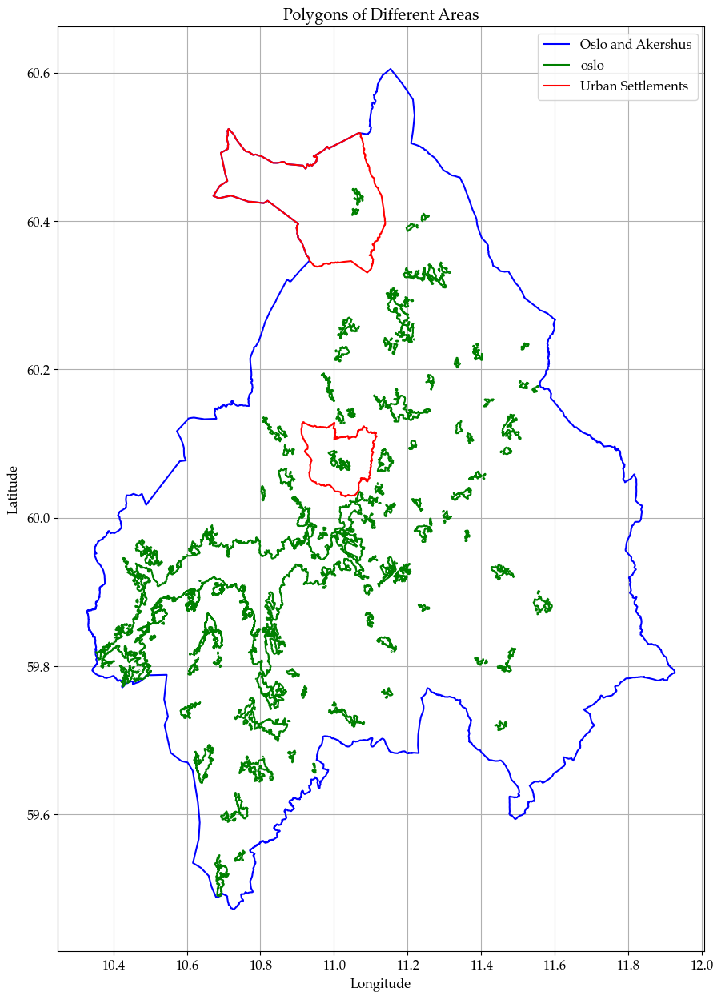

In [19]:
# Call the corrected function to plot the GeoJSON polygons in a single plot
utils.plot_multiple_geojson_polygons_in_one_plot_corrected(
    file_paths=[
        os.path.join(constants.PROJECT_DIRECTORY_PATH, "data", "combined_akershus_oslo.geojson"),
        os.path.join(constants.PROJECT_DIRECTORY_PATH, "data", "clipped_ssb_urban_settlements.geojson"),
        os.path.join(constants.PROJECT_DIRECTORY_PATH, "data", "clipped_fhi_urban_settlements.geojson")
    ],
    labels=["Oslo and Akershus", "Urban Settlements (SSB)", "Urban Settlements (FHI)"],
    colors=["blue", "green", "red"]
)